- 27/07/23: v1 from existing demo cases plus new dataset.
- 28/07/23: complete analysis in place up to MF PAD plotting, this needs some additional work (subselection issues). Tested only with minimal N2 dataset so far.
    - UPDATE: Density mat and MF PADs now working.
- 29/07/23: OCS chapter from current N2 draft case, still a bit messy. 
    - Mods to setup cell. Working with OCS script config and dataset 6189229
    - NO MODS, but may want to add same again for 1D case?
- 29/07/23: C2H4 from N2 draft case, still a bit messy.
    - Issues with mat E remapping?  OK until MFPADs, which have some data but fail to plot?

(chpt:c2h4-case-study)=
# Case study: Generalised bootstrapping for a general asymmetric top scattering system, $C_2H_4~(D_{2h})$

In this chapter, the full code and analysis details of the case study for $C_2H_4$ are given, including obtaining required data, running fits and analysis routines. For more details on the routines, see the {{ PEMtk_docs }}; for the analysis see particularly the [fit fidelity and analysis page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_analysis_demo_150621-tidy.html), and [molecular frame analysis data processing page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html) (full analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case).

## General setup

In the following code cells (see source notebooks for full details) the general setup routines (as per the outline in {numref}`Chpt. %s <sect:basic-fit-setup>` are executed via a configuration script with presets for the case studies herein.

Additionally, the routines will either run fits, or load existing data if available. Since fitting can be computationally demanding, it is, in general, recommended to approach large fitting problems carefully.

````{margin}
```{admonition} General note on fitting

Computational outputs in this chapter are significantly truncated in the PDF, and some simplified plots are used; see source notebooks (via {{ book_repo }}) or {{ book_HTML }} for full details.

```
````

In [1]:
# Configure settings for case study

# Set case study by name
fitSystem='C2H4'
fitStem=f"fit_3D-test_withNoise_orb8"

# Add noise?
addNoise = 'y'
mu, sigma = 0, 0.05  # Up to approx 10% noise (+/- 0.05)

# Batching - number of fits to run between data dumps
batchSize = 10

# Total fits to run
nMax = 10

In [2]:
# Run default config - may need to set full path here

%run '../scripts/setup_notebook.py'

# Set outputs for notebook or PDF (skips Holoviews plots unless glued)
# Note this is set to default 'pl' in script above
if buildEnv == 'pdf':
    paramPlotBackend = 'sns'    # For category plots with paramPlot
else:
    paramPlotBackend = 'hv'
    
# plotBackend = 'sns'    # For category plots with paramPlot

*** Setting up notebook with standard Quantum Metrology Vol. 3 imports...
For more details see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html
To use local source code, pass the parent path to this script at run time, e.g. "setup_fit_demo ~/github"

*** Running: 2023-07-29 13:23:54
Working dir: /home/jovyan/QM3/doc-source/part2
Build env: notebook
None

* Loading packages...


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


* Set Holoviews with bokeh.
Jupyter Book      : 0.15.1
External ToC      : 0.3.1
MyST-Parser       : 0.18.1
MyST-NB           : 0.17.2
Sphinx Book Theme : 1.0.1
Jupyter-Cache     : 0.6.1
NbClient          : 0.7.4


In [3]:
# Pull data from web (C2H4 case)
from epsproc.util.io import getFilesFromGithub

# Set dataName (will be used as download subdir)
dataName = 'C2H4fitting'
# C2H4 matrix elements
GHbranch='3d-AFPAD-dev'
fDictMatE, fAllMatE = getFilesFromGithub(subpath='data/photoionization/C2H4', dataName=dataName, ref=GHbranch) 
# C2H4 alignment data
fDictADM, fAllADM = getFilesFromGithub(subpath='data/alignment/C2H4_ADMs_8TW_120fs_VM', dataName=dataName, ref=GHbranch) 

Querying URL: https://api.github.com/repos/phockett/epsproc/contents/data/photoionization/C2H4?ref=3d-AFPAD-dev
Local file /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_1.0-100.0eV_orb8_B3u.inp.out already exists
Querying URL: https://api.github.com/repos/phockett/epsproc/contents/data/alignment/C2H4_ADMs_8TW_120fs_VM?ref=3d-AFPAD-dev
Local file /home/jovyan/QM3/doc-source/part2/C2H4fitting/ADMs_8TW_120fs_5K.mat already exists


*** Setting up demo fitting workspace and main `data` class object...
Script: QM3 case studies
For more details see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html
To use local source code, pass the parent path to this script at run time, e.g. "setup_fit_demo ~/github"


* Loading packages...

* Loading demo matrix element data from /home/jovyan/QM3/doc-source/part2/C2H4fitting

*** Job subset details
Key: subset
No 'job' info set for self.data[subset].

*** Job orb8 details
Key: orb8
Dir /home/jovyan/QM3/doc-source/part2/C2H4fitting, 1 file(s).
{   'batch': 'ePS ethylene, batch C2H4_1.0-100.0eV, orbital orb8_B3u',
    'event': 'HOMO ioinzation (B3u), wavefn run, 0.5:1:10.5, sph grid',
    'orbE': -10.32127880310325,
    'orbLabel': 'B3u'}

*** Job subset details
Key: subset
No 'job' info set for self.data[subset].

*** Job orb8 details
Key: orb8
Dir /home/jovyan/QM3/doc-source/part2/C2H4fitting, 1 file(s).
{   'batch': 'ePS ethylene, batch C2H4

name,value,initial value,min,max,vary,expression
m_AG_B3U_B3U_0_0_n1_1,1.36649915,1.3664991519534047,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_0_0_1_1,1.36649915,1.3664991519534047,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_2_0_n1_1,1.29860947,1.2986094733813438,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_2_0_1_1,1.29860947,1.2986094733813438,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_2_n2_n1_1,1.38634203,1.3863420274695957,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_2_n2_1_1,1.38634203,1.3863420274695957,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_2_2_n1_1,1.38634203,1.3863420274695957,1.0000e-04,5.00000000,False,m_AG_B3U_B3U_2_n2_n1_1
m_AG_B3U_B3U_2_2_1_1,1.38634203,1.3863420274695957,1.0000e-04,5.00000000,False,m_AG_B3U_B3U_2_n2_n1_1
m_AG_B3U_B3U_4_0_n1_1,0.40035181,0.40035181362745503,1.0000e-04,5.00000000,True,
m_AG_B3U_B3U_4_0_1_1,0.40035181,0.40035181362745503,1.0000e-04,5.00000000,True,



*** Adding Gaussian noise, mu=0, sigma=0.05


*** Setup demo fitting workspace OK.
Dataset: subset, AFBLM
Dataset: sim, AFBLM


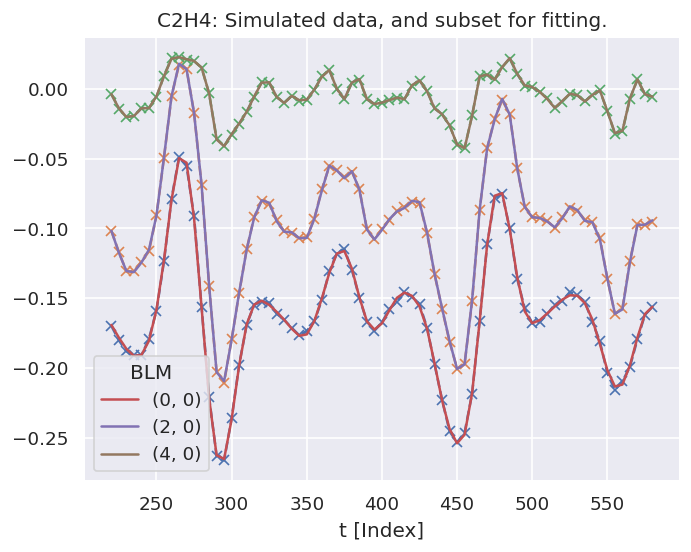

In [4]:
# Fitting setup including data generation and parameter creation

# Set datapath, 
dataPath = Path(Path.cwd(),dataName)
ADMfile = 'ADMs_8TW_120fs_5K.mat'

# Run general config script with dataPath set above
%run "../scripts/setup_fit_case-studies_270723.py" -d {dataPath} -a {ADMfile} -c {fitSystem} -n {addNoise} --sigma {sigma}

## Load existing fit data or run fits

Note that running fits may be quite time-consuming and computationally intensive, depending on the size of the size of the problem. The default case here will run a small batch for testing if there is no existing data found on the `dataPath`, otherwise the data is loaded for analysis.

Set dataFiles: /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle
Read data from /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle with pickle.
Dataset: subset, AFBLM
Dataset: sim, AFBLM


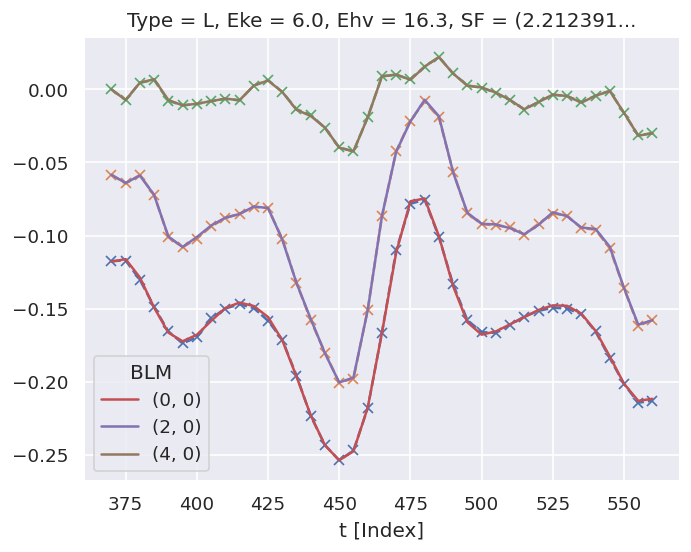

In [5]:
# Look for existing Pickle files on path
dataFiles = list(dataPath.expanduser().glob('*.pickle'))

if not dataFiles:
    print("No data found, executing minimal fitting run...")
    
    # Run fit batch - single
    # data.multiFit(nRange = [n,n+batchSize-1], num_workers=batchSize)

    # Run fit batches with checkpoint files
    for n in np.arange(0,nMax,batchSize):
        print(f'*** Running batch [{n},{n+batchSize-1}], {dt.now().strftime("%d%m%y_%H-%M-%S")}')

        # Run fit batch
        data.multiFit(nRange = [n,n+batchSize-1], num_workers=batchSize)

        # Dump data so far
        data.writeFitData(outStem=f"{fitSystem}_{n+batchSize-1}_{fitStem}")
        
        print(f'Finished batch [{n},{n+batchSize-1}], {dt.now().strftime("%d%m%y_%H-%M-%S")}')
        print(f'Written to file {fitSystem}_{n+batchSize-1}_{fitStem}')

else:
    dataFileIn = dataFiles[-1]   # Add index to select file, although loadFitData will concat multiple files
                                    # Note that concat currently only works for fixed batch sizes however.
    print(f"Set dataFiles: {dataFileIn}")
    data.loadFitData(fList=dataFileIn, dataPath=dataPath)   #.expanduser())
    
    data.BLMfitPlot(keys=['subset','sim'])
    
    # # Check ADMs
    # data.data['subset']['ADM'].unstack().where(data.data['subset']['ADM'].unstack().K>0) \
    #     .real.hvplot.line(x='t').overlay(['K','Q','S'])
    

Dataset: subset, ADM


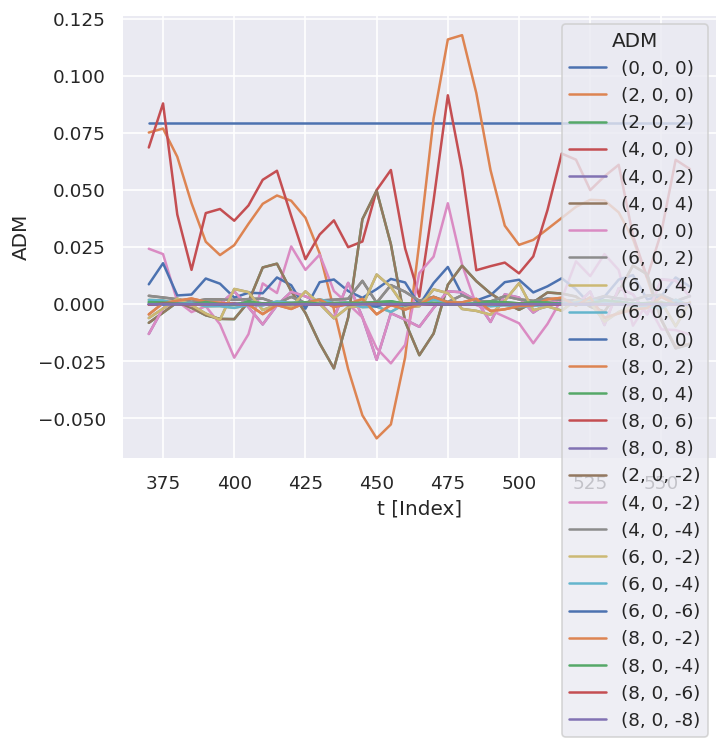

In [6]:
# Check ADMs
# Holoviews
# data.data['subset']['ADM'].unstack().where(data.data['subset']['ADM'].unstack().K>0) \
#     .real.hvplot.line(x='t').overlay(['K','Q','S'])

# Basic plotter
data.ADMplot(keys = 'subset')

In [7]:
# Fits appear as integer indexed items in the main data structure.
data.data.keys()

dict_keys(['subset', 'orb8', 'ADM', 'pol', 'sim', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216

## Post-processing and data overview

Post-processing involves aggregation of all the fit run results into a single data structure. This can then be analysed statistically and examined for for best-fit results. In the statistical sense, this is essentailly a search for candidate {{ RADMATE }}, based on the assumption that some of the minima found in the $chi^2$ hyperspace will be the true results. Even if a clear global minima does not exist, searching for candidate {{ RADMATE }} sets based on clustering of results and multiple local minima is still expected to lead to viable candidates provided that the information content of the dataset is sufficient. However, as discussed elsewhere (see {numref}`Sect. %s <sect:numerics:fitting-strategies>`), in some cases this may not be the case, and other limitations may apply (e.g. certain parameters may be undefined), or additional data required for unique determination of the {{ RADMATE }}.

For more details on the analysis routines, see the {{ PEMtk_docs }}, particularly the [fit fidelity and analysis page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_analysis_demo_150621-tidy.html), and [molecular frame analysis data processing page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html) (full analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case).

In [8]:
# General stats & post-processing to data tables
data.analyseFits()

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
{ 'Fits': 390,
  'Minima': {'chisqr': 5.901473330378771e-05, 'redchi': 8.901166410827708e-08},
  'Stats': { 'chisqr': min       5.901e-05
mean      2.760e-04
median    6.259e-05
max       3.133e-02
std       1.935e-03
var       3.746e-06
Name: chisqr, dtype: float64,
             'redchi': min       8.901e-08
mean      4.164e-07
median    9.440e-08
max       4.726e-05
std       2.919e-06
var       8.521e-12
Name: redchi, dtype: float64},
  'Success': 390}


In [9]:
# The BLMsetPlot routine will output aggregate fit results.
# Here the spread can be taken as a general indication of the uncertainty of 
# the fitting, and indicate whether the fit is well-characterised/the information 
# content of the data is sufficient.
data.BLMsetPlot(xDim = 't', thres=1e-6)  # With xDim and thres set, for more control over outputs

/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:131: RuntimeWarning: All-NaN slice encountered
  lower = np.nanmin(mean-neg_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:132: RuntimeWarning: All-NaN slice encountered
  upper = np.nanmax(mean+pos_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:131: RuntimeWarning: All-NaN slice encountered
  lower = np.nanmin(mean-neg_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:132: RuntimeWarning: All-NaN slice encountered
  upper = np.nanmax(mean+pos_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:131: RuntimeWarning: All-NaN slice encountered
  lower = np.nanmin(mean-neg_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:132: RuntimeWarning: All-NaN slice encountered
  upper = np.nanmax(mean+pos_error)
/opt/conda/lib/python3.10/site-packages/holoviews/element/chart.py:131: RuntimeWarning: All-NaN slic

:Overlay
   .NdOverlay.I  :NdOverlay   [l,m]
      :Spread   [t]   (BLM,BLM_std)
   .NdOverlay.II :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (BLM-ref)
         .Scatter.I :Scatter   [t]   (BLM-ref)

In [10]:
# Write aggregate datasets to HDF5 format
# This is more robust than Pickled data, but PEMtk currently only support output for aggregate (post-processed) fit data.

data.processedToHDF5(dataPath = dataPath, outStem = dataFileIn.name, timeStamp=False)

Dumped self.data[fits][dfLong] to /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle_dfLong.pdHDF with Pandas .to_hdf() routine.
Dumped data to /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle_dfLong.pdHDF with pdHDF.
Dumped self.data[fits][AFxr] to /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle_AFxr.pdHDF with Pandas .to_hdf() routine.
Dumped data to /home/jovyan/QM3/doc-source/part2/C2H4fitting/C2H4_399_fit_3D-test_withNoise_orb8_270723_13-45-22.pickle_AFxr.pdHDF with pdHDF.


/home/jovyan/github/PEMtk/pemtk/fit/_io.py:254: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['expr', 'Param', 'success', 'chisqr', 'redchi'], dtype='object')]

  item.to_hdf(fOut, dataType)   # Write to file with named group dataType


In [11]:
# Histogram fit results (reduced chi^2 vs. fit index)
# This may be quite slow for large datasets, setting limited ranges may help

# Use default auto binning
# data.fitHist()

# Example with range set
data.fitHist(thres=1.11e-4, bins=100)

Mask selected 390 results (from 390).


:AdjointLayout
   :Scatter   [redchi]   (Fit)
   :Histogram   [Fit]   (Fit_count)
   :Histogram   [redchi]   (redchi_count)

Here bands in the $\chi^2$ dimension can indicate groupings (local minima) are consistently found. Assuming each grouping is a viable fit candidate parameter set, these can then be explored in further detail.

## Data exploration

The general aim in this procedure is to ascertain whether there was a good spread of parameters explored, and a single (or few sets) of best-fit results. There are a few procedures and helper methods for this...

### View results

Single results sets can be viewed in the main data structure, indexed by #.

In [12]:
# Check keys
fitNumber = 2
data.data[fitNumber].keys()

dict_keys(['AFBLM', 'residual', 'results'])

Here `results` is an [lmFit object](https://lmfit.github.io/lmfit-py/intro.html), which includes final fit results and information, and `AFBLM` contains the model (fit) output.

An example is shown below. Of particular note here is which parameters have `vary=True` - these are included in the fitting - and if there is a column `expression`, which indicates any parameters defined to have specific relationships (see {numref}`Chpt. %s <sect:basis-sets:fitting-intro>`). Any correlations found during fitting are also shown, which can also indicate parameters which are related (even if this is not predefined or known a priori).

In [13]:
# Show some results
data.data[fitNumber]['results']

## Classify candidate sets

To probe the minima found, the `classifyFits` method can be used. This bins results into "candidate" groups, which can then be examined in detail.

success                   chisqr                  redchi         \
              count unique   top freq  count unique  top freq  count unique   
redchiGroup                                                                   
A                 5      1  True    5    5.0    5.0  0.0  1.0    5.0    5.0   
B                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
C                 3      1  True    3    3.0    3.0  0.0  1.0    3.0    3.0   
D                 3      1  True    3    3.0    3.0  0.0  1.0    3.0    3.0   
E                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
F                 1      1  True    1    1.0    1.0  0.0  1.0    1.0    1.0   
G                 1      1  True    1    1.0    1.0  0.0  1.0    1.0    1.0   
H                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
I                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
J                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
K                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
L                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
M                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
N                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
O                 1      1  True    1    1.0    1.0  0.0  1.0    1.0    1.0   
P                 1      1  True    1    1.0    1.0  0.0  1.0    1.0    1.0   
Q                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   
R                 2      1  True    2    2.0    2.0  0.0  1.0    2.0    2.0   
S                 0      0   NaN  NaN      0      0  NaN  NaN      0      0   

                       
             top freq  
redchiGroup            
A            0.0  1.0  
B            NaN  NaN  
C            0.0  1.0  
D            0.0  1.0  
E            NaN  NaN  
F            0.0  1.0  
G            0.0  1.0  
H            NaN  NaN  
I            NaN  NaN  
J            NaN  NaN  
K            NaN  NaN  
L            NaN  NaN  
M            NaN  NaN  
N            NaN  NaN  
O            0.0  1.0  
P            0.0  1.0  
Q            NaN  NaN  
R            0.0  1.0  
S            NaN  NaN

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


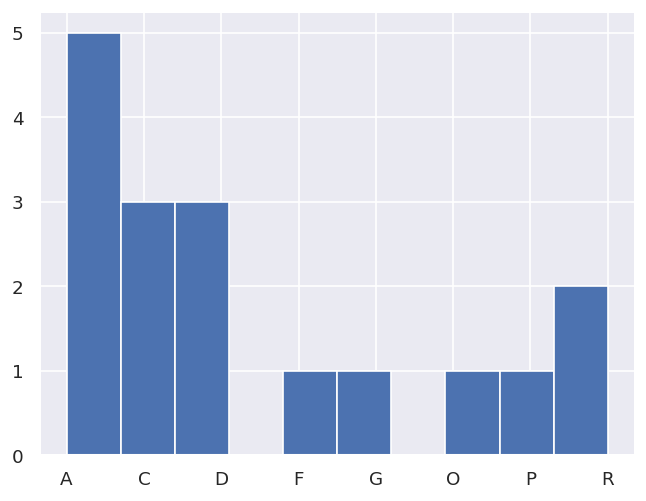

In [14]:
# Run with defaults
# data.classifyFits()

# For more control, pass bins
# Here the minima is set at one end, and a %age range used for bins
minVal = data.fitsSummary['Stats']['redchi']['min']    
binRangePC = 1e-5
data.classifyFits(bins = [minVal, minVal + binRangePC*minVal , 20])

## Explore candidate result sets

Drill-down on a candidate set of results, and examine values and spreads. For more details see {{ PEMtk_docs }}, especially the [analysis routines page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_multiproc_class_analysis_141121-tidy.html). (See also {numref}`Sect. %s <sect:platform:pythonEcosystem>` for details on the plotting libaries implemented here.)

### Raw results

Plot spreads in magnitude and phase parameters. Statistical plots are available for Seaborn and Holoviews backends, with some slightly different options.

In [15]:
# From the candidates, select a group for analysis
selGroup = 'A'

In [16]:
# paramPlot can be used to check the spread on each parameter.
# Plots use Seaborn or Holoviews/Bokeh
# Colour-mapping is controlled by the 'hue' paramter, additionally pass hRound for sig. fig control.
# The remap setting allows for short-hand labels as set in data.lmmu

paramType = 'm' # Set for (m)agnitude or (p)hase parameters
hRound = 14 # Set for cmapping, default may be too small (leads to all grey cmap on points)

data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', 
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [17]:
paramType = 'p' # Set for (m)agnitude or (p)hase parameters
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', backend=paramPlotBackend, hvType='violin', 
               returnFlag = True, hRound=hRound, remap = 'lmMap'); 

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

### Phases, phase shifts & corrections

Depending on how the fit was configured, phases may be defined in different ways. To set the phases relative to a speific parameter, and wrap to a specified range, use the `phaseCorrection()` method. This defaults to using the first parameter as a reference phase, and wraps to $-\pi:\pi$. The phase-corrected values are output to a new Type, 'pc', and a set of normalised magnitudes to 'n'. Additional settings can be passed for more control, as shown below.

In [18]:
# Run phase correction routine
# Set absFlag=True for unsigned phases (mapped to 0:pi)
# Set useRef=False to set ref phase as 0, otherwise the reference value is set.
phaseCorrParams={'absFlag':True, 'useRef':False}
data.phaseCorrection(**phaseCorrParams)  

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = AG_B3U_B3U_0_0_1_1


Param                 AG_B3U_B3U_0_0_1_1  AG_B3U_B3U_0_0_n1_1  \
Fit Type redchiGroup                                            
3   m    D                     1.414e+00            1.414e+00   
    n    D                     1.789e-01            1.789e-01   
    p    D                     8.874e-01           -2.978e+00   
    pc   D                     0.000e+00            2.417e+00   
21  m    R                     2.174e-03            2.174e-03   
    n    R                     3.097e-04            3.097e-04   
    p    R                     2.748e+00           -2.978e+00   
    pc   R                     0.000e+00            5.572e-01   
29  m    D                     1.731e+00            1.731e+00   
    n    D                     1.973e-01            1.973e-01   
    p    D                    -2.009e+00           -2.978e+00   
    pc   D                     0.000e+00            9.695e-01   
62  m    O                     1.993e+00            1.993e+00   
    n    O                     2.679e-01            2.679e-01   
    p    O                    -7.141e-01           -2.978e+00   
    pc   O                     0.000e+00            2.264e+00   
98  m    D                     1.954e+00            1.954e+00   
    n    D                     2.484e-01            2.484e-01   
    p    D                    -1.712e+00           -2.978e+00   
    pc   D                     0.000e+00            1.266e+00   
169 m    A                     1.306e-01            1.306e-01   
    n    A                     2.260e-02            2.260e-02   
    p    A                     3.137e+00           -2.978e+00   
    pc   A                     0.000e+00            1.676e-01   
171 m    A                     1.944e-02            1.944e-02   
    n    A                     2.573e-03            2.573e-03   
    p    A                    -5.230e-01           -2.978e+00   
    pc   A                     0.000e+00            2.455e+00   
177 m    F                     1.956e+00            1.956e+00   
    n    F                     2.672e-01            2.672e-01   
    p    F                    -9.895e-01           -2.978e+00   
    pc   F                     0.000e+00            1.989e+00   
182 m    G                     1.999e+00            1.999e+00   
    n    G                     3.703e-01            3.703e-01   
    p    G                    -9.043e-02           -2.978e+00   
    pc   G                     0.000e+00            2.888e+00   
187 m    C                     3.609e-01            3.609e-01   
    n    C                     5.289e-02            5.289e-02   
    p    C                     2.916e+00           -2.978e+00   
    pc   C                     0.000e+00            3.890e-01   
205 m    P                     5.801e-02            5.801e-02   
    n    P                     6.268e-03            6.268e-03   
    p    P                    -3.142e+00           -2.978e+00   
    pc   P                     0.000e+00            1.632e-01   
240 m    A                     2.000e+00            2.000e+00   
    n    A                     3.596e-01            3.596e-01   
    p    A                    -3.132e-01           -2.978e+00   
    pc   A                     0.000e+00            2.665e+00   
257 m    C                     1.963e+00            1.963e+00   
    n    C                     2.527e-01            2.527e-01   
    p    C                    -1.014e+00           -2.978e+00   
    pc   C                     0.000e+00            1.965e+00   
313 m    A                     1.810e+00            1.810e+00   
    n    A                     2.408e-01            2.408e-01   
    p    A                     3.139e+00           -2.978e+00   
    pc   A                     0.000e+00            1.663e-01   
327 m    R                     8.312e-01            8.312e-01   
    n    R                     1.282e-01            1.282e-01   
    p    R                     2.742e+00           -2.978e+00   
    pc   R                     0.00

Examine new data types...

In [19]:
paramType = 'n'
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', kind='box',
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [20]:
paramType = 'pc'
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', kind='box',
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

## Parameter estimation & fidelity

For case studies, the fit results can be directly compared to the known input parameters. This should give a feel for how well the data defines the matrix elements (parameters) in this case. In general, probing the correlations and spread of results, and comparing to other (unfitted) results is required to estimate fidelity, see {{ QM12 }} for further discussion.

### Best values and statistics

To get a final parameter set and associated statistics, based on a subset of the fit results, the `paramsReport()` method is available. If reference data is available, as for the case studies herein, the `paramsCompare()` method can also be used to compare with the reference case.

In [21]:
# Parameter summary
data.paramsReport(inds = {'redchiGroup':selGroup})

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set parameter stats to self.paramsSummary.


Type                             m      n      p     pc
Param                Agg                               
AG_B3U_B3U_0_0_1_1   min     0.019  0.003 -0.523  0.000
                     mean    1.179  0.187  1.357  0.000
                     median  1.810  0.241  1.345  0.000
                     max     2.000  0.360  3.139  0.000
                     std     1.011  0.165  1.780  0.000
...                            ...    ...    ...    ...
B2G_B3U_B1U_4_n3_0_1 mean    0.837  0.121 -0.442  1.473
                     median  0.927  0.123 -0.516  2.071
                     max     1.897  0.251  1.800  2.762
                     std     0.708  0.095  1.808  1.276
                     var     0.502  0.009  3.267  1.629

[228 rows x 4 columns]

In [22]:
# Parameter comparison
# Note this uses phaseCorrParams as set previously for consistency
data.paramsCompare(phaseCorrParams=phaseCorrParams)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = AG_B3U_B3U_0_0_1_1


Param     AG_B3U_B3U_0_0_1_1  AG_B3U_B3U_0_0_n1_1  AG_B3U_B3U_2_0_1_1  \
Fit Type                                                                
ref m                  1.366                1.366               1.299   
    n                  0.268                0.268               0.255   
    p                  0.163               -2.978              -2.385   
    pc                 0.000                3.142               2.548   

Param     AG_B3U_B3U_2_0_n1_1  AG_B3U_B3U_2_2_1_1  AG_B3U_B3U_2_2_n1_1  \
Fit Type                                                                 
ref m                   1.299               1.386                1.386   
    n                   0.255               0.272                0.272   
    p                   0.756               0.802               -2.340   
    pc                  0.593               0.639                2.503   

Param     AG_B3U_B3U_2_n2_1_1  AG_B3U_B3U_2_n2_n1_1  AG_B3U_B3U_4_0_1_1  \
Fit Type                                                                  
ref m                   1.386                 1.386               0.400   
    n                   0.272                 0.272               0.079   
    p                   0.802                -2.340               2.494   
    pc                  0.639                 2.503               2.331   

Param     AG_B3U_B3U_4_0_n1_1  ...  B1G_B3U_B2U_4_n2_1_1  \
Fit Type                       ...                         
ref m                   0.400  ...                 0.154   
    n                   0.079  ...                 0.030   
    p                  -0.647  ...                -2.025   
    pc                  0.811  ...                 2.188   

Param     B1G_B3U_B2U_4_n2_n1_1  B1G_B3U_B2U_4_n4_1_1  B1G_B3U_B2U_4_n4_n1_1  \
Fit Type                                                                       
ref m                     0.154                 0.035                  0.035   
    n                     0.030                 0.007                  0.007   
    p                    -2.025                 0.037                  0.037   
    pc                    2.188                 0.126                  0.126   

Param     B2G_B3U_B1U_2_1_0_1  B2G_B3U_B1U_2_n1_0_1  B2G_B3U_B1U_4_1_0_1  \
Fit Type                                                                   
ref m                   0.521                 0.521                0.162   
    n                   0.102                 0.102                0.032   
    p                  -0.646                 2.495               -1.079   
    pc                  0.810                 2.332                1.242   

Param     B2G_B3U_B1U_4_3_0_1  B2G_B3U_B1U_4_n1_0_1  B2G_B3U_B1U_4_n3_0_1  
Fit Type                                                                   
ref m                   0.074                 0.162                 0.074  
    n                   0.015                 0.032                 0.015  
    p                  -1.168                 2.063                 1.974  
    pc                  1.331                 1.900                 1.810  

[4 rows x 38 columns]

Set parameter comparison to self.paramsSummaryComp.


/home/jovyan/github/PEMtk/pemtk/fit/_analysis.py:440: PerformanceWarning: indexing past lexsort depth may impact performance.
  dataMerge[item,'diff/std', pcName] = np.abs(dataMerge[item,'diff']/dataMerge[item]['std'] *100)
/home/jovyan/github/PEMtk/pemtk/fit/_analysis.py:440: PerformanceWarning: indexing past lexsort depth may impact performance.
  dataMerge[item,'diff/std', pcName] = np.abs(dataMerge[item,'diff']/dataMerge[item]['std'] *100)


Param                AG_B3U_B3U_0_0_1_1  AG_B3U_B3U_0_0_n1_1  \
Type Source   dType                                            
m    mean     num                 1.179                1.179   
     ref      num                 1.366                1.366   
     diff     %                  15.900               15.900   
              num                -0.187               -0.187   
     std      %                  85.738               85.738   
              num                 1.011                1.011   
     diff/std %                  18.545               18.545   
n    mean     num                 0.187                0.187   
     ref      num                 0.268                0.268   
     diff     %                  43.240               43.240   
              num                -0.081               -0.081   
     std      %                  88.166               88.166   
              num                 0.165                0.165   
     diff/std %                  49.044               49.044   
p    mean     num                 1.357               -2.978   
     ref      num                 0.163               -2.978   
     diff     %                  87.971                0.000   
              num                 1.194                0.000   
     std      %                 131.140                0.000   
              num                 1.780                0.000   
     diff/std %                  67.082                  NaN   
pc   mean     num                 0.000                1.483   
     ref      num                 0.000                3.142   
     diff     %                     NaN              111.866   
              num                 0.000               -1.659   
     std      %                     NaN               82.832   
              num                 0.000                1.228   
     diff/std %                     NaN              135.051   

Param                AG_B3U_B3U_2_0_1_1  AG_B3U_B3U_2_0_n1_1  \
Type Source   dType                                            
m    mean     num                 0.859                0.859   
     ref      num                 1.299                1.299   
     diff     %                  51.143               51.143   
              num                -0.439               -0.439   
     std      %                  79.694               79.694   
              num                 0.685                0.685   
     diff/std %                  64.173               64.173   
n    mean     num                 0.130                0.130   
     ref      num                 0.255                0.255   
     diff     %                  95.963               95.963   
              num                -0.125               -0.125   
     std      %                  76.703               76.703   
              num                 0.100                0.100   
     diff/std %                 125.111              125.111   
p    mean     num                 1.648               -1.497   
     ref      num                -2.385                0.756   
     diff     %                 244.712              150.525   
              num                 4.033               -2.253   
     std      %                  71.415              104.662   
              num                 1.177                1.567   
     diff/std %                 342.663              143.820   
pc   mean     num                 2.132                0.747   
     ref      num                 2.548                0.593   
     diff     %                  19.526               20.602   
              num                -0.416                0.154   
     std      %                  34.350               80.295   
              num                 0.732                0.600   
     diff/std %                  56.845               25.658   

Param                AG_B3U_B3U_2_2_1_1  AG_B3U_B3U_2_2_n1_1  \
Type Source   dType                                            
m    mean     num             

In [23]:
# Display above results With column name remapping to (l,m) labels only

# With Pandas functionality
data.paramsSummaryComp.rename(columns=data.lmmu['lmMap'])

# With utility method
# summaryRenamed = pemtk.fit._util.renameParams(data.paramsSummaryComp, data.lmmu['lmMap']) 
# summaryRenamed

Param                    0,0      0,0      2,0      2,0      2,2      2,2  \
Type Source   dType                                                         
m    mean     num      1.179    1.179    0.859    0.859    1.635    1.635   
     ref      num      1.366    1.366    1.299    1.299    1.386    1.386   
     diff     %       15.900   15.900   51.143   51.143   15.198   15.198   
              num     -0.187   -0.187   -0.439   -0.439    0.248    0.248   
     std      %       85.738   85.738   79.694   79.694   10.684   10.684   
              num      1.011    1.011    0.685    0.685    0.175    0.175   
     diff/std %       18.545   18.545   64.173   64.173  142.256  142.256   
n    mean     num      0.187    0.187    0.130    0.130    0.254    0.254   
     ref      num      0.268    0.268    0.255    0.255    0.272    0.272   
     diff     %       43.240   43.240   95.963   95.963    6.979    6.979   
              num     -0.081   -0.081   -0.125   -0.125   -0.018   -0.018   
     std      %       88.166   88.166   76.703   76.703   18.057   18.057   
              num      0.165    0.165    0.100    0.100    0.046    0.046   
     diff/std %       49.044   49.044  125.111  125.111   38.647   38.647   
p    mean     num      1.357   -2.978    1.648   -1.497   -0.357    0.413   
     ref      num      0.163   -2.978   -2.385    0.756    0.802   -2.340   
     diff     %       87.971    0.000  244.712  150.525  324.612  666.272   
              num      1.194    0.000    4.033   -2.253   -1.159    2.753   
     std      %      131.140    0.000   71.415  104.662  599.642  567.657   
              num      1.780    0.000    1.177    1.567    2.140    2.346   
     diff/std %       67.082      NaN  342.663  143.820   54.134  117.372   
pc   mean     num      0.000    1.483    2.132    0.747    1.267    1.682   
     ref      num      0.000    3.142    2.548    0.593    0.639    2.503   
     diff     %          NaN  111.866   19.526   20.602   49.590   48.847   
              num      0.000   -1.659   -0.416    0.154    0.628   -0.821   
     std      %          NaN   82.832   34.350   80.295   70.160   60.024   
              num      0.000    1.228    0.732    0.600    0.889    1.009   
     diff/std %          NaN  135.051   56.845   25.658   70.681   81.378   

Param                   2,-2     2,-2      4,0      4,0  ...     4,-2  \
Type Source   dType                                      ...            
m    mean     num      1.635    1.635    0.756    0.756  ...    0.127   
     ref      num      1.386    1.386    0.400    0.400  ...    0.154   
     diff     %       15.198   15.198   47.063   47.063  ...   20.847   
              num      0.248    0.248    0.356    0.356  ...   -0.027   
     std      %       10.684   10.684   76.209   76.209  ...  175.285   
              num      0.175    0.175    0.576    0.576  ...    0.223   
     diff/std %      142.256  142.256   61.755   61.755  ...   11.893   
n    mean     num      0.254    0.254    0.124    0.124  ...    0.022   
     ref      num      0.272    0.272    0.079    0.079  ...    0.030   
     diff     %        6.979    6.979   36.651   36.651  ...   34.531   
              num     -0.018   -0.018    0.045    0.045  ...   -0.008   
     std      %       18.057   18.057   78.802   78.802  ...  179.484   
              num      0.046    0.046    0.098    0.098  ...    0.040   
     diff/std %       38.647   38.647   46.511   46.511  ...   19.239   
p    mean     num     -0.357    0.413    0.792    1.156  ...    0.618   
     ref      num      0.802   -2.340    2.494   -0.647  ...   -2.025   
     diff     %      324.612  666.272  214.888  156.011  ...  427.780   
              num     -1.159    2.753   -1.702    1.803  ...    2.643   
     std      %      599.642  567.657  219.427  201.629  ...  392.707   
              num      2.140    2.346    1.738    2.331  ...    2.426   
     diff/std %       54.134  117.372   97.931   77.375  ...  108.931   
pc   mean 

In [24]:
# Plot values vs. reference cases
# NOTE - experimental code, not yet consolidated and wrapped in PEMtk

paramType = 'm'

# Set new DataFrame including "vary" info (missing in default case)
pDict = 'dfWideTest'
# Try using existing function with extra index set...
data._setWide(indexDims = ['Fit','Type','chisqrGroup','redchiGroup','batch', 'vary'], dataWide='dfWideTest')

# plotData = data.paramPlot(dataDict = pDict, selectors={'vary':True, 'Type':'m', 'redchiGroup':selGroup}, hue = 'chisqr', backend='hv', hvType='violin', returnFlag = True, plotScatter=True, remap = 'lmMap', hRound = 12) 
# NO REMAP CASE
plotData = data.paramPlot(dataDict = pDict, selectors={'vary':True, 'Type':paramType, 'redchiGroup':selGroup}, hue = 'chisqr', 
                          backend='hv', hvType='violin', returnFlag = True, plotScatter=True, hRound=hRound)  #, remap='lmMap') 
p1 = data.data['plots']['paramPlot']
# p2 = dataTestSub.hvplot.scatter(x='Param',y='value', marker='o', size=200, color='green')

# Plot ref params... CURRENTLY NOT IN paraPlot(), and that also expects fit data so can't reuse directly here.

dataTest = data.data['fits']['dfRef'].copy()
# data.paramPlot(dataDict = 'dfRef')

# Set axis remap
# dataTest.replace({'Param':data.lmmu['lmMap']}, inplace=True)

# Subset
dataTestSub = data._subsetFromXS(selectors = {'Type':paramType}, data = dataTest)  
p2 = dataTestSub.hvplot.scatter(x='Param',y='value', marker='dash', size=500, color='red')

# p1+p2   # Overlays fail with "NotImplementedError: Iteration on Elements is not supported." Issue with plot types? FIXED - issues was non-plot return from paramPlot()!
p1*p2

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,chisqr)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I   :Violin   [Param]   (value)
   .Scatter.I  :Scatter   [Param]   (value,chisqr)
   .Scatter.II :Scatter   [Param]   (value)

## Using the reconstructed matrix elements

The results tables are accessible directly, and there are also methods to reformat the best fit results for use in further calculations.

In [25]:
# self.paramsSummary contains the results above as Pandas Dataframe, usual Pandas methods can be applied.
data.paramsSummary['data'].describe()

Param,AG_B3U_B3U_0_0_1_1,AG_B3U_B3U_0_0_n1_1,AG_B3U_B3U_2_0_1_1,AG_B3U_B3U_2_0_n1_1,AG_B3U_B3U_2_2_1_1,AG_B3U_B3U_2_2_n1_1,AG_B3U_B3U_2_n2_1_1,AG_B3U_B3U_2_n2_n1_1,AG_B3U_B3U_4_0_1_1,AG_B3U_B3U_4_0_n1_1,...,B1G_B3U_B2U_4_n2_1_1,B1G_B3U_B2U_4_n2_n1_1,B1G_B3U_B2U_4_n4_1_1,B1G_B3U_B2U_4_n4_n1_1,B2G_B3U_B1U_2_1_0_1,B2G_B3U_B1U_2_n1_0_1,B2G_B3U_B1U_4_1_0_1,B2G_B3U_B1U_4_3_0_1,B2G_B3U_B1U_4_n1_0_1,B2G_B3U_B1U_4_n3_0_1
count,20.000,20.000,2.000e+01,20.000,20.000,20.000,20.000,20.000,20.000,20.000,...,20.000,20.000,2.000e+01,2.000e+01,20.000,20.000,20.000,20.000,20.000,20.000
mean,0.681,-0.032,1.192e+00,0.060,0.700,0.996,0.700,0.996,0.600,0.950,...,0.530,0.530,3.539e-01,3.539e-01,0.574,0.947,0.328,0.893,0.126,0.497
std,1.122,1.956,1.058e+00,1.275,1.341,1.358,1.341,1.358,0.956,1.358,...,1.277,1.277,1.192e+00,1.192e+00,0.985,1.281,1.113,1.581,1.518,1.299
min,-0.523,-2.978,1.742e-05,-3.142,-2.239,-3.028,-2.239,-3.028,-1.147,-2.611,...,-2.510,-2.510,-2.675e+00,-2.675e+00,-1.628,-2.865,-1.842,-2.838,-3.136,-3.142
25%,0.000,-0.743,2.197e-01,0.002,0.224,0.255,0.224,0.255,0.084,0.094,...,0.003,0.003,3.668e-04,3.668e-04,0.076,0.242,0.041,0.106,-0.046,0.039
50%,0.077,0.167,1.122e+00,0.217,0.619,1.308,0.619,1.308,0.314,0.816,...,0.089,0.089,1.911e-01,1.911e-01,0.437,0.848,0.218,0.545,0.103,0.227
75%,1.461,1.841,1.830e+00,0.670,1.634,1.852,1.634,1.852,0.827,1.678,...,1.224,1.224,5.559e-01,5.559e-01,1.331,1.666,0.952,2.346,0.711,1.172
max,3.139,2.665,3.141e+00,1.773,3.082,3.076,3.082,3.076,3.051,3.140,...,3.142,3.142,2.846e+00,2.846e+00,2.395,2.899,2.314,3.103,2.775,2.762


In [26]:
# To set matrix elements from aggregate fit results, use `seetAggMatE` for Pandas
data.setAggMatE(simpleForm = True)
data.data['agg']['matEpd']

Set reformatted aggregate data to self.data[agg][matEpd].


Type              m      n      p     pc          comp         compC labels
Cont l m  mu                                                               
AG   0  0 -1  1.179  0.187  1.357  0.000  0.250+1.152j  0.187+0.000j    0,0
           1  1.179  0.187 -2.978  1.483 -1.163-0.192j  0.016+0.186j    0,0
     2  0 -1  0.859  0.130  1.648  2.132 -0.066+0.857j -0.069+0.110j    2,0
           1  0.859  0.130 -1.497  0.747  0.063-0.857j  0.095+0.088j    2,0
       -2 -1  1.635  0.254 -0.357  1.267  1.532-0.571j  0.076+0.243j   2,-2
           1  1.635  0.254  0.413  1.682  1.497+0.656j -0.028+0.253j   2,-2
        2 -1  1.635  0.254 -0.357  1.267  1.532-0.571j  0.076+0.243j    2,2
           1  1.635  0.254  0.413  1.682  1.497+0.656j -0.028+0.253j    2,2
     4  0 -1  0.756  0.124  0.792  0.727  0.531+0.538j  0.093+0.082j    4,0
           1  0.756  0.124  1.156  1.762  0.305+0.692j -0.024+0.122j    4,0
       -2 -1  0.539  0.075  0.366  1.662  0.503+0.193j -0.007+0.075j   4,-2
           1  0.539  0.075  0.552  1.378  0.459+0.283j  0.014+0.074j   4,-2
        2 -1  0.765  0.124 -0.060  2.062  0.764-0.046j -0.058+0.109j    4,2
           1  0.765  0.124  1.382  1.406  0.144+0.752j  0.020+0.122j    4,2
       -4 -1  0.539  0.075  0.366  1.662  0.503+0.193j -0.007+0.075j   4,-4
           1  0.539  0.075  0.552  1.378  0.459+0.283j  0.014+0.074j   4,-4
        4 -1  0.765  0.124 -0.060  2.062  0.764-0.046j -0.058+0.109j    4,4
           1  0.765  0.124  1.382  1.406  0.144+0.752j  0.020+0.122j    4,4
     6  0 -1  1.127  0.166  0.196  1.431  1.105+0.220j  0.023+0.165j    6,0
           1  1.127  0.166  0.708  2.133  0.856+0.733j -0.089+0.141j    6,0
B1G  2 -2 -1  0.993  0.139  0.453  2.561  0.892+0.435j -0.116+0.076j   2,-2
           1  0.993  0.139  0.453  2.561  0.892+0.435j -0.116+0.076j   2,-2
        2 -1  0.993  0.139  0.574  0.910  0.833+0.539j  0.085+0.110j    2,2
           1  0.993  0.139  0.574  0.910  0.833+0.539j  0.085+0.110j    2,2
     4 -2 -1  0.127  0.022 -1.190  1.015  0.047-0.118j  0.012+0.019j   4,-2
           1  0.127  0.022 -1.190  1.015  0.047-0.118j  0.012+0.019j   4,-2
        2 -1  0.326  0.048 -0.260  1.241  0.315-0.084j  0.015+0.045j    4,2
           1  1.295  0.198 -0.260  1.241  1.251-0.333j  0.064+0.187j    4,2
       -4 -1  0.127  0.022  0.618  1.354  0.104+0.074j  0.005+0.022j   4,-4
           1  0.127  0.022  0.618  1.354  0.104+0.074j  0.005+0.022j   4,-4
        4 -1  0.326  0.048  0.082  0.960  0.325+0.027j  0.027+0.039j    4,4
           1  0.326  0.048  0.082  0.960  0.325+0.027j  0.027+0.039j    4,4
B2G  2 -1  0  0.788  0.128  0.187  1.193  0.774+0.147j  0.047+0.119j   2,-1
        1  0  0.788  0.128  0.778  2.093  0.561+0.553j -0.064+0.111j    2,1
     4 -1  0  0.457  0.067 -0.706  1.496  0.348-0.297j  0.005+0.066j   4,-1
        1  0  0.837  0.121  0.273  2.341  0.806+0.225j -0.084+0.087j    4,1
       -3  0  0.457  0.067 -1.739  1.719 -0.076-0.451j -0.010+0.066j   4,-3
        3  0  0.837  0.121 -0.442  1.473  0.757-0.358j  0.012+0.121j    4,3

In [27]:
# To set matrix elements from aggregate fit results, use `aggToXR` for Xarray
# data.aggToXR(refKey = 'orb5', returnType = 'ds', conformDims=True)   # use full ref dataset
data.aggToXR(refKey = 'subset', returnType = 'ds', conformDims=True)   # Subselected matE

Added dim Total
Added dim Targ
Added dim Total
Added dim Targ
Set XR dataset for self.data['agg']['matE']


In [28]:
data.data['agg']['matE']

<xarray.Dataset>
Dimensions:  (Type: 2, LM: 36, Sym: 6, mu: 3, it: 1)
Coordinates:
  * Type     (Type) object 'comp' 'compC'
  * LM       (LM) MultiIndex
  - l        (LM) int64 0 0 0 0 0 0 0 0 0 2 2 2 2 ... 4 4 4 4 6 6 6 6 6 6 6 6 6
  - m        (LM) int64 -4 -3 -2 -1 0 1 2 3 4 -4 -3 ... 4 -4 -3 -2 -1 0 1 2 3 4
  * Sym      (Sym) MultiIndex
  - Cont     (Sym) object 'AG' 'AG' 'B1G' 'B1G' 'B2G' 'B2G'
  - Targ     (Sym) object 'B3U' 'U' 'B3U' 'U' 'B3U' 'U'
  - Total    (Sym) object 'B3U' 'U' 'B2U' 'U' 'B1U' 'U'
  * mu       (mu) int64 -1 0 1
  * it       (it) int64 1
    Eke      float64 6.0
    Ehv      float64 16.3
    SF       complex128 (2.212391+3.6464095j)
Data variables:
    comp     (Type, mu, LM, Sym) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    compC    (Type, mu, LM, Sym) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    subset   (LM, Sym, mu, it) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)

### Density matrices

New (experimental) code for density matrix plots and comparison. See {numref}`Sect. %s <sec:density-mat-basicsec:density-mat-basic>` for discussion. Code adapted from the {{ PEMtk_docs }} [MF reconstruction page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html#Density-matrix-plottinghttps://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html#Density-matrix-plotting), original analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case.

In [29]:
# import numpy as np

def unsignedPhase(da):
    """Convert to unsigned phases."""
    # Set mag, phase
    mag = da.pipe(np.abs)
    phase = da.pipe(np.angle)  # Returns np array only!
    
    # Set unsigned
    magUS = mag.pipe(np.abs)
#     phaseUS = phase.pipe(np.abs)  
    phaseUS = np.abs(phase)
    
    # Set complex
    compFixed = magUS * np.exp(1j* phaseUS)
#     return mag,phase
    return compFixed

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
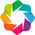

Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.
Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.
Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.


:Layout
   .NdLayout.Left_parenthesis_a_right_parenthesis_Reference_density_matrix_left_parenthesis_unsigned_phases_right_parenthesis :NdLayout   [Component]
      :HeatMap   [l,m,mu,l,m,mu_p]   (C2H4_1.0-100.0eV_orb8_B3u.inp.out)
   .NdLayout.Left_parenthesis_b_right_parenthesis_Reconstructed                                                               :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (compC)
   .NdLayout.Left_parenthesis_c_right_parenthesis_Difference                                                                  :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (Difference)

In [30]:
# v2 - as v1, but differences for unsigned phase case & fix labels
# 26/07/22: messy but working. Some labelling tricks to push back into matPlot() routine

# Import routines
from epsproc.calc import density


# Compose density matrix

# Set dimensions/state vector/representation
# These must be in original data, but will be restacked as necessary to define the effective basis space.
denDims = ['LM', 'mu']
selDims = {'Type':'L'}
pTypes=['r','i']
thres = 1e-2    # 0.2 # Threshold out l>3 terms if using full 'orb5' set.
normME = False
normDen = 'max'
usPhase = True # Use unsigned phases?

# Calculate - Ref case
# matE = data.data['subset']['matE']
# Set data from master class
# k = 'orb5'  # N2 orb5 (SG) dataset
k = 'subset'
matE = data.data[k]['matE']
if normME:
    matE = matE/matE.max()

if usPhase:
    matE = unsignedPhase(matE)
    
daOut, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut = daOut/daOut.max()
elif normDen=='trace':
    daOut = daOut/(daOut.sum('Sym').pipe(np.trace)**2)  # Need sym sum here to get 2D trace
    
# daPlot = density.matPlot(daOut.sum('Sym'))
daPlot = density.matPlot(daOut.sum('Sym'), pTypes=pTypes)

# Retrieved
matE = data.data['agg']['matE']['compC']
selDims = {'Type':'compC'}  # For stacked DS case need to set selDims again here to avoid null data selection below.
if normME:
    matE = matE/matE.max()
    
if usPhase:
    matE = unsignedPhase(matE)
    
daOut2, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut2 = daOut2/daOut2.max()
elif normDen=='trace':
    daOut2 = daOut2/(daOut2.sum('Sym').pipe(np.trace)**2)
    
daPlot2 = density.matPlot(daOut2.sum('Sym'), pTypes=pTypes)   #.sel(Eke=slice(0.5,1.5,1)))


# Compute difference
if usPhase:
    daDiff = unsignedPhase(daOut.sum('Sym')) - unsignedPhase(daOut2.sum('Sym'))

else:
    daDiff = daOut.sum('Sym') - daOut2.sum('Sym')

daDiff.name = 'Difference'
daPlotDiff = density.matPlot(daDiff, pTypes=pTypes)



#******** Plot
daLayout = (daPlot.redim(pType='Component').layout('Component').relabel('(a) Reference density matrix (unsigned phases)') + daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(b) Reconstructed') + 
                daPlotDiff.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(c) Difference')).cols(1)  
daLayout.opts(ep.plot.hvPlotters.opts.HeatMap(width=300, frame_width=300, aspect='square', tools=['hover'], colorbar=True, cmap='coolwarm'))  # .opts(show_title=False)  # .opts(title="Custom Title")  #OK



# Notes on titles... see https://holoviews.org/user_guide/Customizing_Plots.html
#
# .relabel('Test') and .opts(title="Custom Title") OK for whole row titles
#
# daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('Recon')  Turns off titles per plot, then titles layout
#
# .redim() to modify individual plot group label (from dimension name) 

If the reconstruction is good, the differences (fidelity) should be on the order of the experimental noise level/reconstruction uncertainty, around 10% in the case studies herein.

### Plot MF PADs

Routines as per https://pemtk.readthedocs.io/en/latest/topical_review_case_study/MFPAD_replotting_from_file_190722-dist.html - currently not working. Seems to be some difference in dim stacking/assignment now...? Might be Python/Xarray version change, or PEMtk/ePSproc implementation.

In [31]:
dataIn = data.data['agg']['matE'].copy()

# # Restack for MFPAD plotter
# from epsproc.util.listFuncs import dataTypesList

# refDims = dataTypesList()
# refDims = refDims['matE']['def']
# dataStacked = dataIn.stack(refDims(sType='sDict'))
# dataStacked

# # Style 1: if full ref dataset included (with Eke dim)
# # Create empty ePSbase class instance, and set data
# # Can then use existing  padPlot() routine for all data
# from epsproc.classes.base import ePSbase
# dataTest = ePSbase(verbose = 1)

# aList = [i for i in dataIn.data_vars]  # List of arrays

# # Loop version & propagate attrs
# dataType = 'matE'
# for item in aList:
#     if item.startswith('orb'):
#         selType='L'
#     else:
#         selType = item
        
#     dataTest.data[item] = {dataType : dataIn[item].sel({'Type':selType})}

# Style 2: single Eke dim case
# Create empty ePSbase class instance, and set data
# Can then use existing  padPlot() routine for all data
from epsproc.classes.base import ePSbase
dataTest = ePSbase(verbose = 1)

aList = [i for i in dataIn.data_vars]  # List of arrays

# Loop version & propagate attrs
dataType = 'matE'
for item in aList:
    if item.startswith('sub'):
        dataTest.data[item] = {dataType : dataIn[item]}
    else:
        selType = item
        dataTest.data[item] = {dataType : dataIn[item].sel({'Type':selType})}
        
    # Push singleton Eke value to dim for plotter
    dataTest.data[item][dataType] = dataTest.data[item][dataType].expand_dims('Eke')
    

In [32]:
aList

['comp', 'compC', 'subset']

In [33]:
item='compC'
dataType='matE'
dataTest.data[item][dataType].sum('Sym')  #.Eke

<xarray.DataArray 'compC' (Eke: 1, mu: 3, LM: 36)>
array([[[ 0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.18721782+0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        , -0.04022968+0.31895639j,
          0.        +0.j        , -0.06922378+0.11009373j,
          0.        +0.j        ,  0.16161432+0.3525191j ,
          0.        +0.j        ,  0.        +0.j        ,
         -0.00203663+0.09679916j,  0.        +0.j        ,
          0.00497183+0.09394501j,  0.        +0.j        ,
          0.09268794+0.08240636j,  0.        +0.j        ,
         -0.04287093+0.15424917j,  0.        +0.j        ,
         -0.03095352+0.14818949j,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.02316583+0.16464885j,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ],
        [ 0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
...
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ],
        [ 0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.01644878+0.18649384j,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        , -0.14453838+0.3290707j ,
          0.        +0.j        ,  0.09541312+0.08836797j,
          0.        +0.j        ,  0.05730561+0.36263341j,
          0.        +0.j        ,  0.        +0.j        ,
          0.01922708+0.09572301j,  0.        +0.j        ,
          0.02623554+0.09286886j,  0.        +0.j        ,
         -0.02354725+0.12176777j,  0.        +0.j        ,
          0.08427388+0.30905877j,  0.        +0.j        ,
          0.04763319+0.16111829j,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        , -0.08861874+0.14068624j,
          0.        +0.j        ,  0.        +0.j        ,
          0.        +0.j        ,  0.        +0.j        ]]])
Coordinates:
    Type     <U5 'compC'
  * LM       (LM) MultiIndex
  - l        (LM) int64 0 0 0 0 0 0 0 0 0 2 2 2 2 ... 4 4 4 4 6 6 6 6 6 6 6 6 6
  - m        (LM) int64 -4 -3 -2 -1 0 1 2 3 4 -4 -3 ... 4 -4 -3 -2 -1 0 1 2 3 4
  * mu       (mu) int64 -1 0 1
  * Eke      (Eke) float64 6.0
    Ehv      float64 16.3
    SF       complex128 (2.212391+3.6464095j)


*** Plotting for keys = ['compC', 'subset', 'diff'], one per row ***

Summing over dims: {'Sym'}
Plotting from self.data[compC][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.5214239219736496+0.022951139781162703j). This may be unphysical and/or result in plotting issues.


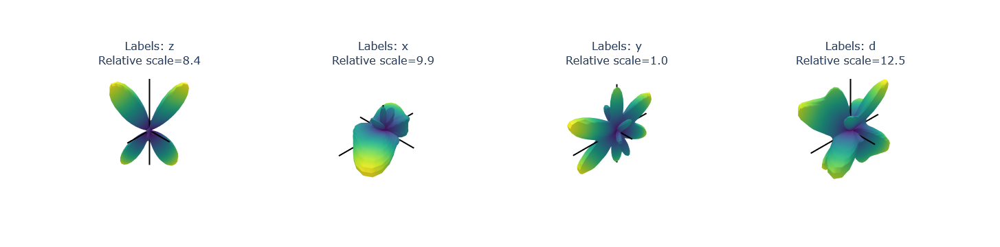

Set plot to self.data['compC']['plots']['TX']['polar']
Summing over dims: {'Sym'}
Plotting from self.data[subset][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-2.1995881102765638-1.7326034658043272j). This may be unphysical and/or result in plotting issues.


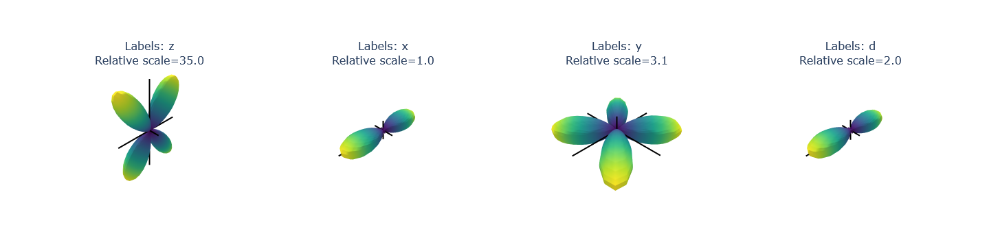

Set plot to self.data['subset']['plots']['TX']['polar']
Summing over dims: set()
Plotting from self.data[diff][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-2.3320464367292586-1.7034063015641985j). This may be unphysical and/or result in plotting issues.


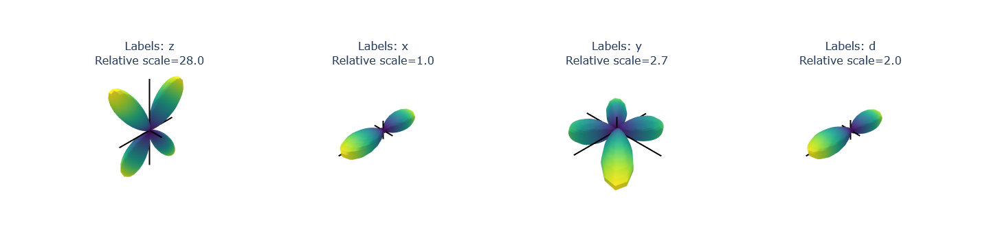

Set plot to self.data['diff']['plots']['TX']['polar']


In [34]:
# Set polarization geoms from Euler angles

# import numpy as np
# import epsproc as ep

# Set Euler angs to include diagonal pol case
pRot = [0, 0, np.pi/2, 0]
tRot = [0, np.pi/2, np.pi/2, np.pi/4]
cRot = [0, 0, 0, 0]
labels = ['z','x','y', 'd']
eulerAngs = np.array([labels, pRot, tRot, cRot]).T   # List form to use later, rows per set of angles


# Should also use MFBLM function below instead of numeric version?
# Numeric version is handy for direct surface and difference case.
R = ep.setPolGeoms(eulerAngs = eulerAngs)
# R

# Basic version - working, but get separate plots per set.
# UPDATE: use this to generate all raw figures, then restack plotly objects below

Erange=[5.5,7,1]  # Set for a single E-point

# Comparison and diff
pKey = [i for i in dataIn.data_vars if i!='comp']  # List of arrays
dataTest.mfpadNumeric(keys=pKey, R = R)   # Compute MFPADs for each set of matrix elements using numerical routine
# ep.mfpad

dataTest.data['diff'] = {'TX': dataTest.data['subset']['TX'].sum('Sym')-dataTest.data['compC']['TX'].sum('Sym')}  # Add sum over sym to force matching dims
pKey.extend(['diff'])

# Plot
print(f"\n*** Plotting for keys = {pKey}, one per row ***\n")  # Note plot labels could do with some work!
dataTest.padPlot(keys=pKey, Erange=Erange, backend='pl',returnFlag=True, plotFlag=True) # Generate plotly polar surf plots for each dataset

In [35]:
# Check max differences (abs values)
maxDiff = dataTest.data['diff']['plots']['TX']['pData'].sum(['Theta','Phi']).max(dim='Eke')
maxDiff.to_pandas()

Labels
z   -3.553e-15-1.554e-15j
x   -7.506e+02+2.579e+02j
y    2.782e+02-1.127e+02j
d   -5.307e+02+1.823e+02j
dtype: complex128

Summing over dims: {'Sym'}
Plotting from self.data[comp][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-1.6131672537699897+1.7273193052489058j). This may be unphysical and/or result in plotting issues.


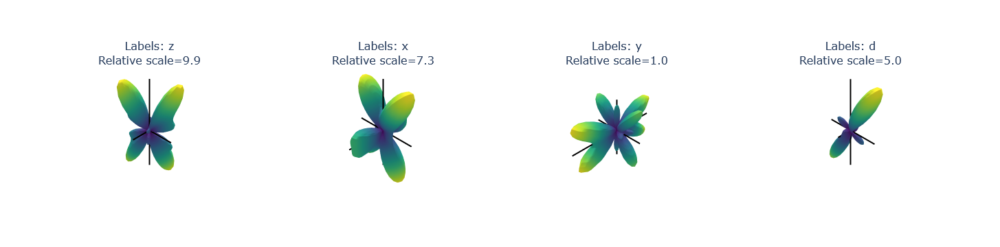

Set plot to self.data['comp']['plots']['TX']['polar']


In [36]:
# Check case without phase correction too - this should indicate poor agreement in general
pKey = 'comp'
dataTest.mfpadNumeric(keys=pKey, R = R) 
dataTest.padPlot(keys=pKey, Erange=Erange, backend='pl',returnFlag=True, plotFlag=True) # Generate plotly polar surf plots for each dataset

In [37]:
# SKIP THIS - output very slow!
# TODO: fix plot labelling above.

# Version for unified plotting - stack individual plots to grid
# See https://plotly.com/python/subplots
# And https://plot.ly/python/3d-subplots

saveFigs = True
from datetime import datetime as dt
timeString = dt.now()

import plotly.graph_objects as go
from plotly.subplots import make_subplots

#*** Set gridding
# rc = [int(np.ceil(rc[0])), int(np.ceil(rc[1]))]
rc=[4,4]  # All data
# rc=[2,2]  # Test set
showscale = False

#*** Set data norms
# norm = None #
norm = 'global'

Rmax = 1.1
padding = 0.1
aRanges = dict(range=[-(Rmax + padding), Rmax+padding])
aspect = 'cube' # 'auto' # 'cube'   # 'auto' with no ranges is pretty good, or set ranges & use cube (otherwise get distorted shapes)

#*** Set camera
# Camera settings, https://plotly.com/python/3d-camera-controls/
# camera = dict(eye=dict(x=2, y=2, z=0.1))

# Defaults
# Default parameters which are used when `layout.scene.camera` is not provided
# camera = dict(
#     up=dict(x=0, y=0, z=1),
#     center=dict(x=0, y=0, z=0),
#     eye=dict(x=1.25, y=1.25, z=1.25)
# )

# Slightly lower... plus x-rotation
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    # eye=dict(x=0.8, y=1.25, z=0.8)  # Not bad... bit close?
    eye=dict(x=0.8, y=1.5, z=0.8)
)


#*** Set subplots
pType = {'type':'surface'}
specs = [[pType] * rc[1] for i in range(rc[0])]  # Set specs as 2D list of dicts.

# titles = [f"{facetDim}: {item.item()}" for item in dataPlot[facetDim]]
titles = []
colTitles =  [f'Pol({item.upper()})' for item in dataTest.data['subset']['TX'].Labels.values[0:rc[1]].tolist()]
# rowTitles = ['Mean', 'Mean phase-corrected', 'Ref', 'Diff(Ref - PC)']
rowTitles = ['Ref', 'Mean phase-corrected', 'Diff(Ref - PC)', 'Mean']

# pKey = [pKey[2], pKey[0:1], pKey[3]]  # ['comp', 'compC', 'orb5', 'diff']
pKey = ['subset', 'compC', 'diff', 'comp']   # Row ordering

fig = make_subplots(rows=rc[0], cols=rc[1], specs=specs, subplot_titles=titles, 
                    column_titles = colTitles, row_titles = rowTitles,
                    vertical_spacing = 0.05) # Note basic row/whitespace control here
fig.update_layout(height=1200, width=1200)

# Loop & grid from existing objects
n=0
for rInd in range(1,rc[0]+1):
    for cInd in range(1,rc[1]+1):
        
        # print(f'{rInd},{cInd}')
        trace = dataTest.data[pKey[rInd-1]]['plots']['TX']['polar'][0].data[cInd-1]
        
        fig.add_trace(go.Surface(x=trace['x'], y=trace['y'], z=trace['z'], colorscale='Viridis', showscale=showscale),
                    row=rInd, col=cInd)
        
        # Set string for "scene" (axis) object to update - will be labelled scene1, scene2... by Plotly.
        n=n+1
        sceneN = f'scene{n}'
        if norm == 'global':
            # Try looping... OK with dict unpacking... huzzah!
            # NOTE Scene indexing starts at 1, so do this after n increments
            # options = dict(xaxis = aRanges, yaxis = aRanges, zaxis = aRanges, aspectmode='cube')
            options = dict(xaxis = aRanges, yaxis = aRanges, zaxis = aRanges, aspectmode=aspect, camera=camera)

        else:
            # options = dict(aspectmode='cube')
            # options = dict(aspectmode='auto')  # Better for scaling up details?
            options = dict(aspectmode=aspect, camera=camera)

        fig.update_layout(**{sceneN:options})  # No effect of aspect here? auto/cube/data/manual


# fig.show()   # fig.show() quite slow for multiple surface plots - export & viewing seems better!
if saveFigs:
    fName = f'dataDump_1000fitTests_multiFit_noise_051021_MFPADs_{timeString.strftime("%d%m%y")}'
    fig.write_html(f'{fName}.html')
    fig.write_image(f'{fName}.png')

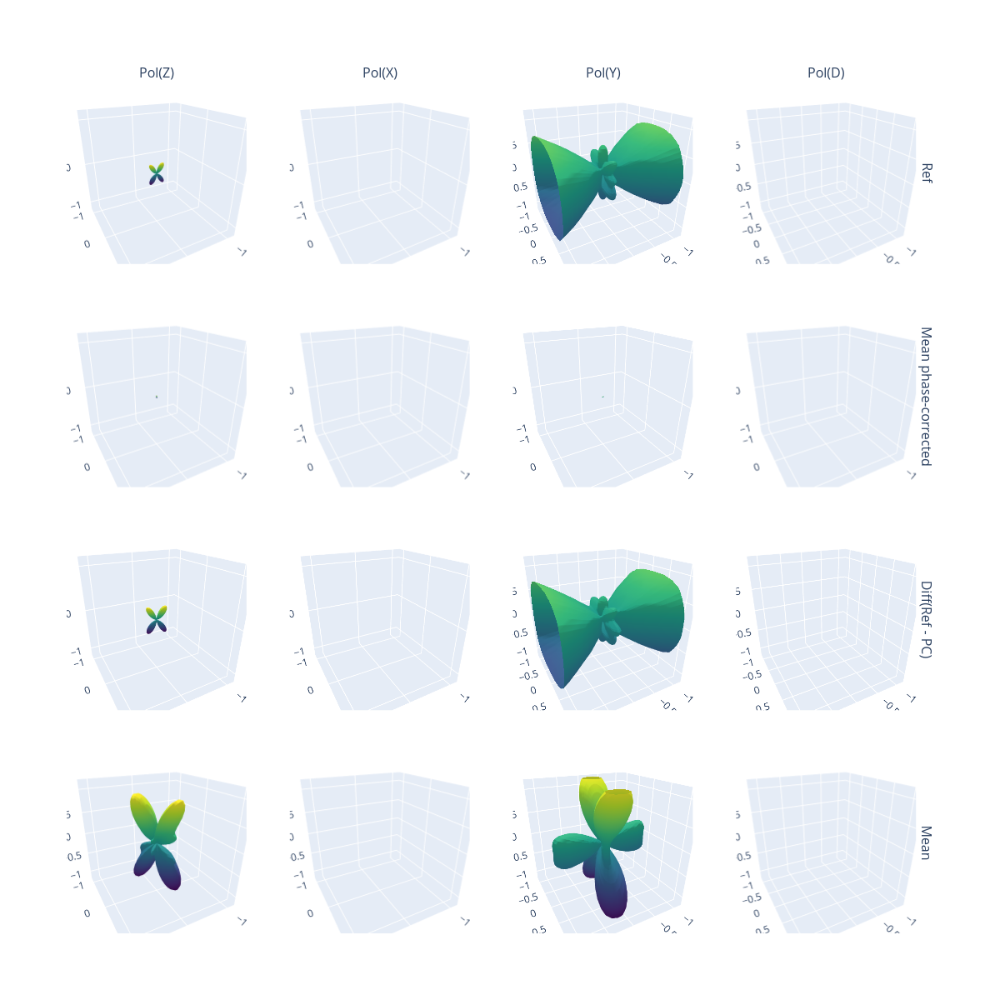

In [38]:
# Optional plot in notebook
# fig.show()   # Interactive plot - maybe quite slow

# Show image
Image(f'{fName}.png')

# SCRATCH

In [39]:
data.lmmu  #['lmMap']

{'Index': MultiIndex([( 'AG', 'B3U', 'B3U', 0,  0, -1, 1),
             ( 'AG', 'B3U', 'B3U', 0,  0,  1, 1),
             ( 'AG', 'B3U', 'B3U', 2,  0, -1, 1),
             ( 'AG', 'B3U', 'B3U', 2,  0,  1, 1),
             ( 'AG', 'B3U', 'B3U', 2, -2, -1, 1),
             ( 'AG', 'B3U', 'B3U', 2, -2,  1, 1),
             ( 'AG', 'B3U', 'B3U', 2,  2, -1, 1),
             ( 'AG', 'B3U', 'B3U', 2,  2,  1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  0, -1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  0,  1, 1),
             ( 'AG', 'B3U', 'B3U', 4, -2, -1, 1),
             ( 'AG', 'B3U', 'B3U', 4, -2,  1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  2, -1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  2,  1, 1),
             ( 'AG', 'B3U', 'B3U', 4, -4, -1, 1),
             ( 'AG', 'B3U', 'B3U', 4, -4,  1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  4, -1, 1),
             ( 'AG', 'B3U', 'B3U', 4,  4,  1, 1),
             ( 'AG', 'B3U', 'B3U', 6,  0, -1, 1),
             ( 'AG', 'B3U', 'B3U', 6,  0,

In [40]:
data.paramsSummaryComp.columns

Index(['AG_B3U_B3U_0_0_1_1', 'AG_B3U_B3U_0_0_n1_1', 'AG_B3U_B3U_2_0_1_1',
       'AG_B3U_B3U_2_0_n1_1', 'AG_B3U_B3U_2_2_1_1', 'AG_B3U_B3U_2_2_n1_1',
       'AG_B3U_B3U_2_n2_1_1', 'AG_B3U_B3U_2_n2_n1_1', 'AG_B3U_B3U_4_0_1_1',
       'AG_B3U_B3U_4_0_n1_1', 'AG_B3U_B3U_4_2_1_1', 'AG_B3U_B3U_4_2_n1_1',
       'AG_B3U_B3U_4_4_1_1', 'AG_B3U_B3U_4_4_n1_1', 'AG_B3U_B3U_4_n2_1_1',
       'AG_B3U_B3U_4_n2_n1_1', 'AG_B3U_B3U_4_n4_1_1', 'AG_B3U_B3U_4_n4_n1_1',
       'AG_B3U_B3U_6_0_1_1', 'AG_B3U_B3U_6_0_n1_1', 'B1G_B3U_B2U_2_2_1_1',
       'B1G_B3U_B2U_2_2_n1_1', 'B1G_B3U_B2U_2_n2_1_1', 'B1G_B3U_B2U_2_n2_n1_1',
       'B1G_B3U_B2U_4_2_1_1', 'B1G_B3U_B2U_4_2_n1_1', 'B1G_B3U_B2U_4_4_1_1',
       'B1G_B3U_B2U_4_4_n1_1', 'B1G_B3U_B2U_4_n2_1_1', 'B1G_B3U_B2U_4_n2_n1_1',
       'B1G_B3U_B2U_4_n4_1_1', 'B1G_B3U_B2U_4_n4_n1_1', 'B2G_B3U_B1U_2_1_0_1',
       'B2G_B3U_B1U_2_n1_0_1', 'B2G_B3U_B1U_4_1_0_1', 'B2G_B3U_B1U_4_3_0_1',
       'B2G_B3U_B1U_4_n1_0_1', 'B2G_B3U_B1U_4_n3_0_1'],
      dtype='object', n

In [41]:
remap = 'lmMap'
data.paramsSummaryComp.replace({'Param':data.lmmu[remap]}, inplace=False)

Param                AG_B3U_B3U_0_0_1_1  AG_B3U_B3U_0_0_n1_1  \
Type Source   dType                                            
m    mean     num                 1.179                1.179   
     ref      num                 1.366                1.366   
     diff     %                  15.900               15.900   
              num                -0.187               -0.187   
     std      %                  85.738               85.738   
              num                 1.011                1.011   
     diff/std %                  18.545               18.545   
n    mean     num                 0.187                0.187   
     ref      num                 0.268                0.268   
     diff     %                  43.240               43.240   
              num                -0.081               -0.081   
     std      %                  88.166               88.166   
              num                 0.165                0.165   
     diff/std %                  49.044               49.044   
p    mean     num                 1.357               -2.978   
     ref      num                 0.163               -2.978   
     diff     %                  87.971                0.000   
              num                 1.194                0.000   
     std      %                 131.140                0.000   
              num                 1.780                0.000   
     diff/std %                  67.082                  NaN   
pc   mean     num                 0.000                1.483   
     ref      num                 0.000                3.142   
     diff     %                     NaN              111.866   
              num                 0.000               -1.659   
     std      %                     NaN               82.832   
              num                 0.000                1.228   
     diff/std %                     NaN              135.051   

Param                AG_B3U_B3U_2_0_1_1  AG_B3U_B3U_2_0_n1_1  \
Type Source   dType                                            
m    mean     num                 0.859                0.859   
     ref      num                 1.299                1.299   
     diff     %                  51.143               51.143   
              num                -0.439               -0.439   
     std      %                  79.694               79.694   
              num                 0.685                0.685   
     diff/std %                  64.173               64.173   
n    mean     num                 0.130                0.130   
     ref      num                 0.255                0.255   
     diff     %                  95.963               95.963   
              num                -0.125               -0.125   
     std      %                  76.703               76.703   
              num                 0.100                0.100   
     diff/std %                 125.111              125.111   
p    mean     num                 1.648               -1.497   
     ref      num                -2.385                0.756   
     diff     %                 244.712              150.525   
              num                 4.033               -2.253   
     std      %                  71.415              104.662   
              num                 1.177                1.567   
     diff/std %                 342.663              143.820   
pc   mean     num                 2.132                0.747   
     ref      num                 2.548                0.593   
     diff     %                  19.526               20.602   
              num                -0.416                0.154   
     std      %                  34.350               80.295   
              num                 0.732                0.600   
     diff/std %                  56.845               25.658   

Param                AG_B3U_B3U_2_2_1_1  AG_B3U_B3U_2_2_n1_1  \
Type Source   dType                                            
m    mean     num             

In [42]:
data.paramFidelity()

TypeError: phaseCorrection() got multiple values for argument 'self'